# Implementation of PCA with KNN in pixel dataset

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
df = pd.read_csv('train2.csv')

In [3]:
df.shape

(42000, 785)

In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
34307,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
import matplotlib.pyplot as plt

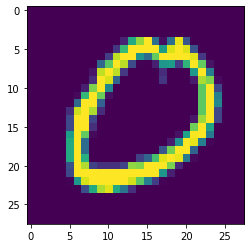

In [6]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

This graph is showing combination of each data point as pixal 

In [7]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [8]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [9]:
X_train.shape

(33600, 784)

In [10]:
from sklearn.neighbors import KNeighborsClassifier

# Before Model building

In [11]:
knn = KNeighborsClassifier()

In [12]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [13]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

10.664026975631714


In [14]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

# Before applying PCA, we have to first do mean centering of data

In [15]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [16]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [17]:
# PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [18]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [19]:
X_train_trf.shape

(33600, 200)

In [20]:
knn = KNeighborsClassifier()

In [21]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [22]:
# pip install --upgrade scikit-learn threadpoolctl


In [23]:
X_test_trf[0]

array([-5.00669776e+00, -2.63019775e+00,  2.70940772e+00,  1.15901279e+00,
       -8.14029372e-01,  1.48234806e+00, -2.06755718e+00, -1.00505026e+00,
       -2.32058116e+00, -3.95893206e+00, -1.18356000e+00, -2.75058059e-01,
        1.48179446e+00, -2.70096458e-01,  2.06825400e+00,  1.81400979e+00,
       -1.72391148e+00,  1.99344118e+00,  6.77710033e-01, -5.19035288e-01,
       -4.61852199e-01,  2.65097145e+00, -1.82425937e+00,  9.01315122e-01,
       -1.98749602e-01, -3.05108025e-01, -1.43564085e+00, -8.38769971e-01,
        1.47997726e-01, -7.26556770e-01, -1.60728184e-01, -4.46424375e-02,
        5.92260931e-01, -5.00635567e-01,  9.17799468e-01, -1.54128711e+00,
       -5.80044678e-01, -1.95279946e+00, -2.02925615e+00,  2.49192610e-01,
       -3.08753325e-01, -1.25474173e+00,  4.89938539e-01, -1.16906209e-01,
       -6.05467492e-01, -7.29580371e-01,  1.77983126e+00, -5.08174238e-01,
        2.30463980e-01, -4.41296683e-01,  6.13978717e-01,  8.31974883e-01,
        2.31683990e-01, -

In [24]:
y_pred = knn.predict(X_test_trf)


In [25]:
accuracy_score(y_test,y_pred)

0.9503571428571429

In [26]:
# for i in range(1,785):
#     pca = PCA(n_components=i)
#     X_train_trf = pca.fit_transform(X_train)
#     X_test_trf = pca.transform(X_test)
    
#     knn = KNeighborsClassifier()
    
#     knn.fit(X_train_trf,y_train)
    
#     y_pred = knn.predict(X_test_trf)
    
#     print(accuracy_score(y_test,y_pred))
    

In [27]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [28]:
X_train_trf

array([[-2.71862713, -0.49039741],
       [-0.67695596, -6.75373578],
       [-3.03322685,  6.50995262],
       ...,
       [ 2.14883109,  0.78145785],
       [ 1.05957953,  0.94721156],
       [17.70261273,  1.9618828 ]])

In [29]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

Basically, we reduce our data dimensions to 2D. So, this graph shows that those pixels or data points exist in a 2D dimension

In [30]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [31]:
X_train_trf

array([[-2.71863659, -0.48973118,  1.13498421],
       [-0.67701338, -6.75384694, -2.33443868],
       [-3.03321024,  6.50961499,  7.49203568],
       ...,
       [ 2.14882501,  0.78080574, -0.74750257],
       [ 1.05958276,  0.94798653,  3.94845918],
       [17.70254808,  1.96190696, -4.94361764]])

In [32]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

As shown in the above graph, we reduced our data to 2D, and similarly, in this graph, we reduced our data dimensionality to 3D, so it looks like this

In [33]:
pca.explained_variance_
# Eigen values

array([40.67111197, 29.17023399, 26.74459585])

In [34]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [35]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])